In [ ]:
import pandas as pd
from google.colab import files
import numpy as np
%load_ext google.colab.data_table
import seaborn as sns
import matplotlib.pyplot as plt

The google.colab.data_table extension is already loaded. To reload it, use:
  %reload_ext google.colab.data_table


In [ ]:
uploaded = files.upload()

Saving healthcare-dataset-stroke-data.csv to healthcare-dataset-stroke-data (1).csv


In [ ]:
t_stroke = pd.read_csv('healthcare-dataset-stroke-data.csv')



# Introduction


Dans notre projet, nous allons voir un domaine dans lequel le machine learning peut se réveler utile mais où il soulève également des questions éthiques : celui de la santé.

Notre but sera donc, suivant différents paramètres, de prédire le risque d'AVC chez des patients.

Pour cela, nous allons utiliser différentes méthodes et les comparer afin d'ensuite voir quel serait le meilleur choix.

# Présentation de nos données

Nos données proviennent d'ici : https://www.kaggle.com/fedesoriano/stroke-prediction-dataset

Elle comprend de base plus de 5000 exemples avec 11 attributs (nous ne considèrerons pas l'id).

On cherchera donc à prédire l'étiquette 'stroke' suivant : 

  - Le genre
  - L'âge
  - L'hypertension 
  - Si le sujet a une maladie cardiaque
  - Si il est marié
  - Son secteur d'emploi
  - Si il habite en milieu rural ou urbain
  - Son taux de glucose
  - Son indice de masse corporelle (BMI)
  - Si il a fumé

Il s'agira donc d'un problème de classification binaire. (Apprentissage supervisé)

In [ ]:

t_stroke


,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


In [ ]:
t_stroke = pd.concat([t_stroke.iloc[:249],t_stroke], ignore_index=True)
t_stroke = pd.concat([t_stroke.iloc[:249],t_stroke], ignore_index=True)
t_stroke = pd.concat([t_stroke.iloc[:249],t_stroke], ignore_index=True)

In [ ]:
t_stroke['stroke'].value_counts()

0    4861
1     996
Name: stroke, dtype: int64

In [ ]:
t_stroke['smoking_status'] = t_stroke['smoking_status'].apply(lambda x: np.NaN if (x == 'Unknown') else x)

In [ ]:
t_stroke.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5857 entries, 0 to 5856
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 5857 non-null   int64  
 1   gender             5857 non-null   object 
 2   age                5857 non-null   float64
 3   hypertension       5857 non-null   int64  
 4   heart_disease      5857 non-null   int64  
 5   ever_married       5857 non-null   object 
 6   work_type          5857 non-null   object 
 7   Residence_type     5857 non-null   object 
 8   avg_glucose_level  5857 non-null   float64
 9   bmi                5536 non-null   float64
 10  smoking_status     4172 non-null   object 
 11  stroke             5857 non-null   int64  
dtypes: float64(3), int64(4), object(5)
memory usage: 549.2+ KB


In [ ]:
t_stroke.isnull()

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,True,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
5852,False,False,False,False,False,False,False,False,False,True,False,False
5853,False,False,False,False,False,False,False,False,False,False,False,False
5854,False,False,False,False,False,False,False,False,False,False,False,False
5855,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
t_stroke.isnull().sum()

id                      0
gender                  0
age                     0
hypertension            0
heart_disease           0
ever_married            0
work_type               0
Residence_type          0
avg_glucose_level       0
bmi                   321
smoking_status       1685
stroke                  0
dtype: int64

On supprime les lignes avec données manquantes, on reste tout de même sur un dataset assez fourni

In [ ]:
t_stroke.dropna(inplace=True)
t_stroke.isnull().sum()

id                   0
gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

On crée ensuite des groupes d'âges par décénies

In [ ]:
age_labels = ['0-9', '10-19', '20-29', '30-39', '40-49', '50-59', '60-69', '70-79','80-89']
t_stroke['Age_group'] = pd.cut(t_stroke.age, range(0, 91, 10), right=False, labels=age_labels)
t_stroke.head(20)

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,Age_group
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1,60-69
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1,80-89
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1,40-49
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1,70-79
5,56669,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1,80-89
6,53882,Male,74.0,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1,70-79
7,10434,Female,69.0,0,0,No,Private,Urban,94.39,22.8,never smoked,1,60-69
10,12109,Female,81.0,1,0,Yes,Private,Rural,80.43,29.7,never smoked,1,80-89
11,12095,Female,61.0,0,1,Yes,Govt_job,Rural,120.46,36.8,smokes,1,60-69
12,12175,Female,54.0,0,0,Yes,Private,Urban,104.51,27.3,smokes,1,50-59


In [ ]:
t_stroke.Age_group.value_counts()

50-59    759
70-79    609
60-69    590
40-49    590
30-39    515
20-29    423
80-89    251
10-19    229
0-9        0
Name: Age_group, dtype: int64

In [ ]:
t_stroke = t_stroke.drop(columns=['age'])

On transforme les attributs (comme par exemple le type d'emploi) en valeur numérique.

In [ ]:
from sklearn.preprocessing import OrdinalEncoder
enc = OrdinalEncoder()
list_cat = ["gender","ever_married","work_type","Residence_type","smoking_status","Age_group"]
for el_cat in list_cat:
  t_stroke[el_cat] = enc.fit_transform(t_stroke[[el_cat]])

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


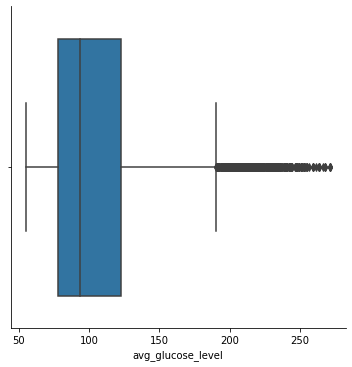

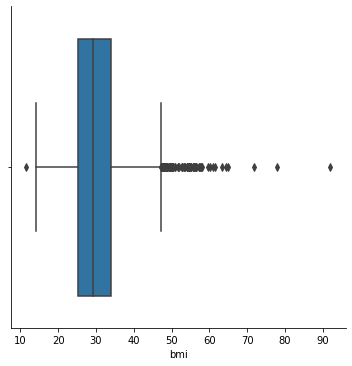

In [ ]:
PA = sns.factorplot(data = t_stroke , x = 'avg_glucose_level' , kind = 'box')
PA = sns.factorplot(data = t_stroke , x = 'bmi' , kind = 'box')

In [ ]:
from collections import Counter
def detect_outliers(df,n,features):
    """
    Takes a dataframe df of features and returns a list of the indices
    corresponding to the observations containing more than n outliers according
    to the Tukey method.
    """
    outlier_indices = []
    
    # iterate over features(columns)
    for col in features:
        
        # 1st quartile (25%)
        Q1 = np.percentile(df[col], 25)
        
        # 3rd quartile (75%)
        Q3 = np.percentile(df[col],75)
        
        # Interquartile range (IQR)
        IQR = Q3 - Q1
        
        # outlier step
        outlier_step = 1.5 * IQR
        
        # Determine a list of indices of outliers for feature col
        outlier_list_col = df[(df[col] < Q1 - outlier_step) | 
                              (df[col] > Q3 + outlier_step )].index
        # append the found outlier indices for col to the list of outlier indices 
        outlier_indices.extend(outlier_list_col)
        #print(outlier_list_col)
   
        
    # select observations containing more than 2 outliers
    outlier_indices = Counter(outlier_indices)  

    multiple_outliers = list( k for k, v in outlier_indices.items() if v > n )
    return multiple_outliers   

Outliers_to_drop = detect_outliers(t_stroke,0,["avg_glucose_level"])
t_stroke.drop(Outliers_to_drop, inplace=True)
Outliers_to_drop = detect_outliers(t_stroke,0,["bmi"])
t_stroke.drop(Outliers_to_drop, inplace=True)

/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/usr/local/lib/python3.7/dist-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)


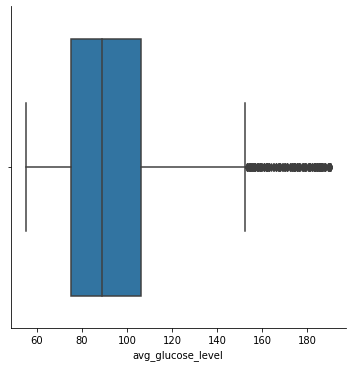

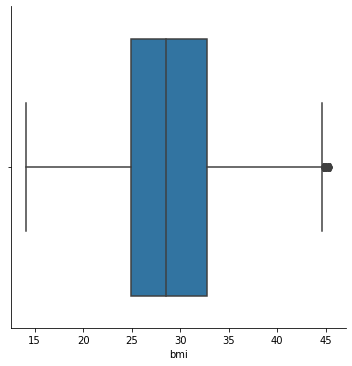

In [ ]:
PA = sns.factorplot(data = t_stroke , x = 'avg_glucose_level' , kind = 'box')
PA = sns.factorplot(data = t_stroke , x = 'bmi' , kind = 'box')

In [ ]:
t_stroke

,id,gender,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,Age_group
2,31112,1.0,0,1,1.0,2.0,0.0,105.92,32.5,1.0,1,7.0
3,60182,0.0,0,0,1.0,2.0,1.0,171.23,34.4,2.0,1,3.0
4,1665,0.0,1,0,1.0,3.0,0.0,174.12,24.0,1.0,1,6.0
5,56669,1.0,0,0,1.0,2.0,1.0,186.21,29.0,0.0,1,7.0
6,53882,1.0,1,1,1.0,2.0,0.0,70.09,27.4,1.0,1,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5847,68398,1.0,1,0,1.0,3.0,0.0,71.97,28.3,1.0,0,7.0
5849,45010,0.0,0,0,1.0,2.0,0.0,77.93,21.7,1.0,0,4.0
5853,44873,0.0,0,0,1.0,3.0,1.0,125.20,40.0,1.0,0,7.0
5854,19723,0.0,0,0,1.0,3.0,0.0,82.99,30.6,1.0,0,2.0


In [ ]:
from sklearn.preprocessing import StandardScaler
numericals_list = ['avg_glucose_level']
for column in numericals_list:
    sc = StandardScaler(with_mean=True, with_std=True)
    sc.fit(t_stroke[column].values.reshape(-1,1))
    t_stroke[column] = sc.transform(t_stroke[column].values.reshape(-1,1))
numericals_list = ['bmi']
for column in numericals_list:
    sc = StandardScaler(with_mean=True, with_std=True)
    sc.fit(t_stroke[column].values.reshape(-1,1))
    t_stroke[column] = sc.transform(t_stroke[column].values.reshape(-1,1))


In [ ]:
t_stroke

,id,gender,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke,Age_group
2,31112,1.0,0,1,1.0,2.0,0.0,0.420993,0.554012,1.0,1,7.0
3,60182,0.0,0,0,1.0,2.0,1.0,2.797417,0.875170,2.0,1,3.0
4,1665,0.0,1,0,1.0,3.0,0.0,2.902574,-0.882747,1.0,1,6.0
5,56669,1.0,0,0,1.0,2.0,1.0,3.342491,-0.037595,0.0,1,7.0
6,53882,1.0,1,1,1.0,2.0,0.0,-0.882747,-0.308043,1.0,1,6.0
...,...,...,...,...,...,...,...,...,...,...,...,...
5847,68398,1.0,1,0,1.0,3.0,0.0,-0.814340,-0.155916,1.0,0,7.0
5849,45010,0.0,0,0,1.0,2.0,0.0,-0.597474,-1.271517,1.0,0,4.0
5853,44873,0.0,0,0,1.0,3.0,1.0,1.122531,1.821740,1.0,0,7.0
5854,19723,0.0,0,0,1.0,3.0,0.0,-0.413357,0.232854,1.0,0,2.0


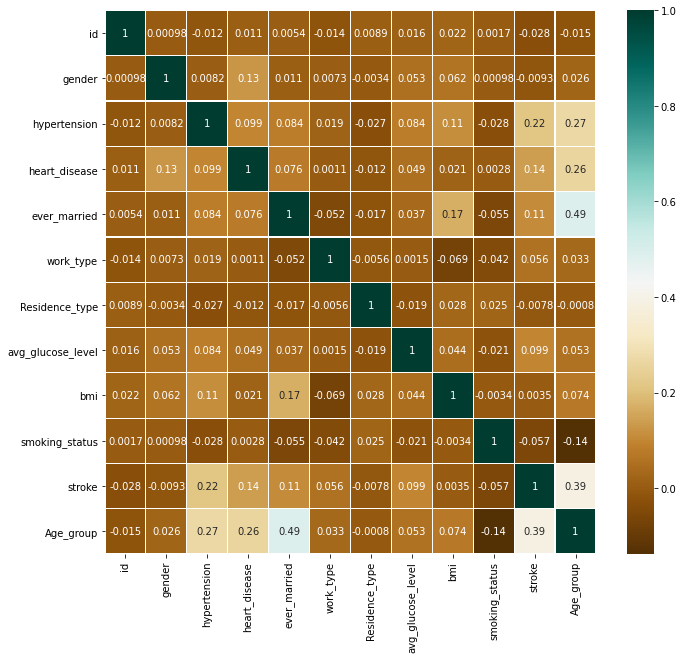

In [ ]:
corr_matrix = t_stroke.corr()
plt.figure(figsize=(11, 10))
sns.heatmap(data = corr_matrix,cmap='BrBG', annot=True, linewidths=0.2)

Pas de corrélation très importante entre les variables, il n'est pas nécessaire de faire une ACP.

In [ ]:
from sklearn.utils import shuffle
t_stroke = shuffle(t_stroke, n_samples=2883)
frames1 = []
frames2 = []
frames1.append(t_stroke.iloc[:3200])
frames2.append(t_stroke.iloc[3200:])
train_stroke = pd.concat(frames1)
test_stroke = pd.concat(frames2)

In [ ]:
X_train = train_stroke.drop(['stroke'],axis=1)
X_train = X_train.drop(['id'],axis=1)
y_train = train_stroke['stroke']
X_test = test_stroke.drop(['stroke'],axis=1)
X_test = X_test.drop(['id'],axis=1)
y_test = test_stroke['stroke']

In [ ]:
from sklearn.model_selection import train_test_split
X = t_stroke.drop(['stroke','id'], axis = 1)
Y = t_stroke['stroke']

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.3) # 70% train / 30% test

In [ ]:
y_test.value_counts()

0    715
1    150
Name: stroke, dtype: int64

# Régression logistique


Le premier choix de méthodes est une régression logistique 

In [ ]:
from sklearn.linear_model import LogisticRegression
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

d = logmodel.decision_function(X_test)

array([[689,  26],
       [127,  23]])

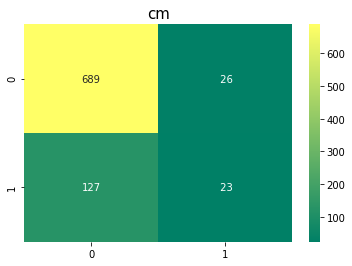

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred_log = logmodel.predict(X_test)
cm = confusion_matrix(y_test,y_pred_log)
sns.heatmap(confusion_matrix(y_test,y_pred_log),annot=True,fmt='3.0f',cmap="summer")
plt.title('cm', y=1.05, size=15)
cm

In [ ]:
print(logmodel.score(X_test,y_test))

0.823121387283237


In [ ]:
print(logmodel.score(X_train,y_train))

0.8562933597621407


In [ ]:
from sklearn.model_selection import cross_validate
scores_logmodel = cross_validate(logmodel, X_train, y_train, cv=3, scoring=('accuracy','precision','recall','roc_auc'))
print(scores_logmodel)

print("score moyen :" + str(scores_logmodel['test_accuracy'].mean()))
print("vitesse moyenne fit_time : " + str(scores_logmodel['fit_time'].mean())) 

{'fit_time': array([0.02992392, 0.02305341, 0.02017617]), 'score_time': array([0.00785208, 0.0076189 , 0.00747609]), 'test_accuracy': array([0.84992571, 0.85586924, 0.86309524]), 'test_precision': array([0.47368421, 0.53846154, 0.575     ]), 'test_recall': array([0.18181818, 0.14141414, 0.23469388]), 'test_roc_auc': array([0.78643579, 0.83602576, 0.83723245])}
score moyen :0.8562967286964316
vitesse moyenne fit_time : 0.024384498596191406


# Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 50, random_state = 2020, max_depth=20)
rf.fit(X_train,y_train)
y_test_pred = rf.predict(X_test)
print(rf.score(X_train,y_train)) 
print(rf.score(X_test,y_test)) 

1.0
0.9884393063583815


array([[708,   7],
       [  3, 147]])

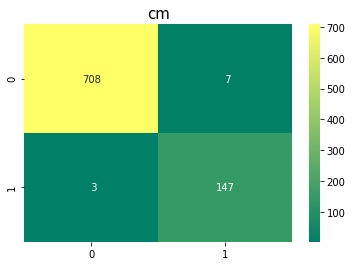

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = rf.predict(X_test)
cm = confusion_matrix(y_test,y_pred)
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='3.0f',cmap="summer")
plt.title('cm', y=1.05, size=15)
cm

On va ensuite tuner les hyperparamètres pour avoir un modèle plus optimisé :

In [ ]:

from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(start = 20, stop = 200, num = 10)]
print(n_estimators)


[20, 40, 60, 80, 100, 120, 140, 160, 180, 200]


In [ ]:
max_depth = [int(x) for x in np.linspace(20, 100, num = 5)]
print(max_depth)

[20, 40, 60, 80, 100]


In [ ]:
random_grid = { 'n_estimators': n_estimators, 'max_depth' : max_depth}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
rf_random.fit(X_train,y_train)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:281: UserWarning: The total space of parameters 50 is smaller than n_iter=100. Running 50 iterations. For exhaustive searches, use GridSearchCV.
  % (grid_size, self.n_iter, grid_size), UserWarning)
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:    8.2s
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:   33.5s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    ccp_alpha=0.0,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=20,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    max_samples=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                 

In [ ]:
print(rf_random.best_params_)

{'n_estimators': 160, 'max_depth': 20}


In [ ]:
rf = RandomForestClassifier(n_estimators = 160, random_state = 2020, max_depth=20)
rf.fit(X_train,y_train)
y_pred = rf.predict(X_test)
print(rf.score(X_train,y_train))
print(rf.score(X_test,y_test))




1.0
0.9872832369942196


array([[707,   8],
       [  3, 147]])

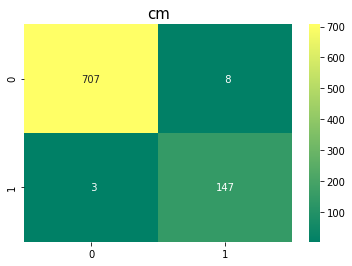

In [ ]:

cm = confusion_matrix(y_test,y_pred)
sns.heatmap(confusion_matrix(y_test,y_pred),annot=True,fmt='3.0f',cmap="summer")
plt.title('cm', y=1.05, size=15)
cm

In [ ]:
scores_rf = cross_validate(rf, X_train, y_train, cv=3, scoring=('accuracy','precision','recall','roc_auc'))
print(scores_rf)

print("Le score moyen est :" + str(scores_rf['test_accuracy'].mean()))
print("La vitesse moyenne fit_time : " + str(scores_rf['fit_time'].mean())) 

{'fit_time': array([0.33340549, 0.34816742, 0.31178093]), 'score_time': array([0.05432034, 0.05467868, 0.05903864]), 'test_accuracy': array([0.95393759, 0.94205052, 0.94791667]), 'test_precision': array([0.88636364, 0.875     , 0.83870968]), 'test_recall': array([0.78787879, 0.70707071, 0.79591837]), 'test_roc_auc': array([0.93446662, 0.91918312, 0.94100654])}
Le score moyen est :0.9479682598646194
La vitesse moyenne fit_time : 0.3311179478963216


# Conclusion


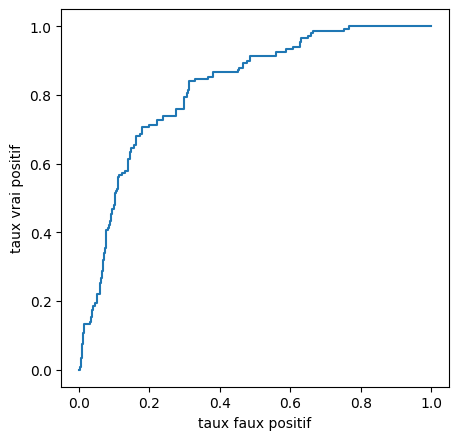

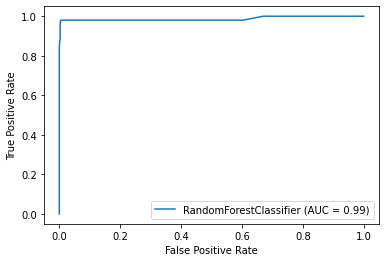

In [ ]:
from sklearn.metrics import roc_curve, auc, plot_roc_curve

logistic_fpr, logistic_tpr, threshold = roc_curve(y_test, d)
auc_logistic = auc(logistic_fpr, logistic_tpr)





plt.figure(figsize = (5,5), dpi = 100)

plt.plot(logistic_fpr,logistic_tpr, linestyle = "-", label="Log"%auc_logistic)

plt.ylabel("taux vrai positif")
plt.xlabel("taux faux positif")

plot_roc_curve(rf, X_test, y_test)

plt.show()